# Design of Predictor for Multivariate Time Series
---

# Test Plan
---
<table>
<thead>
  <tr>
    <th rowspan="2">Test</th>
    <th rowspan="2">Dataset</th>
    <th colspan="2">Model<br></th>
    <th colspan="3">Errors</th>
    <th colspan="3">Timings<br></th>
    <th colspan="3">Data Splits<br></th>
  </tr>
  <tr>
    <td>ARIMA</td>
    <td>SARIMA</td>
    <td>MSE</td>
    <td>RMSE</td>
    <td>Log-RMS</td>
    <td>Selection</td>
    <td>Train</td>
    <td>Test/Validate</td>
    <td>Train</td>
    <td>Validate<br></td>
    <td>Test</td>
  </tr>
</thead>
<tbody>
  <tr>
    <td rowspan="4">Model Selection</td>
    <td><a href="./pm25_x.csv">pm25_x</a></td>
    <td>3,1,3</td>
    <td>0,1,2,24</td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td><a href="./venezia.csv">venezia</a></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td><a href="./venezia.csv">venezia(Seasonal)</a></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td>Solar Power Generation</td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td>Time Series Prediction</td>
    <td><a href="./venezia.csv">venezia</a></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td rowspan="3">PCA Compression/Decompression</td>
    <td><a href="./pm25_x.csv">pm25_x</a></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td><a href="./venezia.csv">venezia</a></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td>Solar Power Generation</td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
  <tr>
    <td>Prediction Accuracy</td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
    <td></td>
  </tr>
</tbody>
</table>

In [2]:
%matplotlib inline
import statsmodels.api as sm
from pandas import read_csv, DataFrame, Series
from datetime import datetime
import numpy as np
import plotly.express as px

In [4]:
bpi = read_csv('pm25_x.csv', engine='c', low_memory=True)
bpi

,Unnamed: 0,ds,pm2.5,DEWP,TEMP,PRES,cbwd,Iws_x,Ir_x,Is_x
0,0,2010-01-01 00:00:00,NaN,-21,-11.0,1021.0,NW,1.79,0,0
1,1,2010-01-01 01:00:00,NaN,-21,-12.0,1020.0,NW,3.13,0,0
2,2,2010-01-01 02:00:00,NaN,-21,-11.0,1019.0,NW,1.79,0,0
3,3,2010-01-01 03:00:00,NaN,-21,-14.0,1019.0,NW,3.13,0,0
4,4,2010-01-01 04:00:00,NaN,-20,-12.0,1018.0,NW,3.13,0,0
...,...,...,...,...,...,...,...,...,...,...
43819,43819,2014-12-31 19:00:00,8.0,-23,-2.0,1034.0,NW,5.81,0,0
43820,43820,2014-12-31 20:00:00,10.0,-22,-3.0,1034.0,NW,5.81,0,0
43821,43821,2014-12-31 21:00:00,10.0,-22,-3.0,1034.0,NW,4.92,0,0
43822,43822,2014-12-31 22:00:00,8.0,-22,-4.0,1034.0,NW,4.02,0,0


In [4]:
bpi_components = bpi[['pm2.5','DEWP', 'TEMP', 'PRES', 'cbwd', 'Iws_x', 'Ir_x', 'Is_x']]
bpi_components

,pm2.5,DEWP,TEMP,PRES,cbwd,Iws_x,Ir_x,Is_x
0,NaN,-21,-11.0,1021.0,NW,1.79,0,0
1,NaN,-21,-12.0,1020.0,NW,3.13,0,0
2,NaN,-21,-11.0,1019.0,NW,1.79,0,0
3,NaN,-21,-14.0,1019.0,NW,3.13,0,0
4,NaN,-20,-12.0,1018.0,NW,3.13,0,0
...,...,...,...,...,...,...,...,...
43819,8.0,-23,-2.0,1034.0,NW,5.81,0,0
43820,10.0,-22,-3.0,1034.0,NW,5.81,0,0
43821,10.0,-22,-3.0,1034.0,NW,4.92,0,0
43822,8.0,-22,-4.0,1034.0,NW,4.02,0,0


# Principle Component Analysis and Compression
Principle Component Analysis is the Study of the Correlation of Data with respect to Eigen Projection of the data with respect to covariance of the data. \
$X_{x y}$ is Data Matrix. \
$C_{x x}$ is Covariance Matrix. \
<font style='font-size: 1.15em;'>
\begin{equation*}
    Cov(X_{i j}) = C_{j j} \\
    C_{j j}\vec{v} = \lambda\vec{v} \\
    PC_{n} = \vec{v_{n}} \times X_{i j}
\end{equation*}
</font>

In [5]:
bpi_normal = DataFrame()
pm_n = (bpi_components['pm2.5'] - np.mean(bpi_components['pm2.5'])) 
dewp_n = (bpi_components['DEWP'] - np.mean(bpi_components['DEWP'])) 
temp_n = (bpi_components['TEMP'] - np.mean(bpi_components['TEMP'])) 
pres_n = (bpi_components['PRES'] - np.mean(bpi_components['PRES'])) 
iws_n = (bpi_components['Iws_x'] - np.mean(bpi_components['Iws_x'])) 
ir_n = (bpi_components['Ir_x'] - np.mean(bpi_components['Ir_x'])) 
is_n = (bpi_components['Is_x'] - np.mean(bpi_components['Is_x']))
pm_m =  np.mean(bpi_components['pm2.5']) 
dewp_m = np.mean(bpi_components['DEWP']) 
temp_m = np.mean(bpi_components['TEMP']) 
pres_m = np.mean(bpi_components['PRES']) 
iws_m =  np.mean(bpi_components['Iws_x']) 
ir_m = np.mean(bpi_components['Ir_x']) 
is_m = np.mean(bpi_components['Is_x'])
bpi_normal['pm2.5'] = pm_n
bpi_normal['DEWP'] = dewp_n
bpi_normal['TEMP'] = temp_n
bpi_normal['PRES'] = pres_n
bpi_normal['Iws_x'] = iws_n
bpi_normal['Ir_x'] = ir_n
bpi_normal['Is_x'] = is_n
bpi_normal

,pm2.5,DEWP,TEMP,PRES,Iws_x,Ir_x,Is_x
0,NaN,-22.817246,-23.448521,4.552346,-1.154428,-0.099169,-0.017045
1,NaN,-22.817246,-24.448521,3.552346,0.185572,-0.099169,-0.017045
2,NaN,-22.817246,-23.448521,2.552346,-1.154428,-0.099169,-0.017045
3,NaN,-22.817246,-26.448521,2.552346,0.185572,-0.099169,-0.017045
4,NaN,-21.817246,-24.448521,1.552346,0.185572,-0.099169,-0.017045
...,...,...,...,...,...,...,...
43819,-90.613215,-24.817246,-14.448521,17.552346,2.865572,-0.099169,-0.017045
43820,-88.613215,-23.817246,-15.448521,17.552346,2.865572,-0.099169,-0.017045
43821,-88.613215,-23.817246,-15.448521,17.552346,1.975572,-0.099169,-0.017045
43822,-90.613215,-23.817246,-16.448521,17.552346,1.075572,-0.099169,-0.017045


In [6]:
filter_weights = bpi_normal.cov()['pm2.5']
filter_weights.abs().sort_values(ascending=False)

pm2.5    8473.273782
DEWP      227.757042
TEMP      101.464469
Iws_x      78.470703
PRES       44.832442
Ir_x        2.325105
Is_x        0.778090
Name: pm2.5, dtype: float64

In [7]:
bpi_XVAL = bpi_normal[['pm2.5', 'DEWP', 'TEMP', 'PRES', 'Iws_x', 'Ir_x', 'Is_x']].to_numpy()

# Todo
1. Make Neural Net for PCA Compressor
2. Make Cummalative Binary PCA Compressor

In [8]:
bpi_normal.cov()

,pm2.5,DEWP,TEMP,PRES,Iws_x,Ir_x,Is_x
pm2.5,8473.273782,227.757042,-101.464469,-44.832442,-78.470703,-2.325105,0.778090
DEWP,227.757042,208.324198,145.191457,-115.360725,-11.116882,1.426471,-0.115772
TEMP,-101.464469,145.191457,148.806154,-103.554433,-0.734484,0.570607,-0.272233
PRES,-44.832442,-115.360725,-103.554433,105.446158,2.181951,-0.648187,0.175880
Iws_x,-78.470703,-11.116882,-0.734484,2.181951,5.555964,-0.032463,-0.018131
Ir_x,-2.325105,1.426471,0.570607,-0.648187,-0.032463,0.713028,-0.001690
Is_x,0.778090,-0.115772,-0.272233,0.175880,-0.018131,-0.001690,0.113326


In [9]:
eigen = np.linalg.eig(bpi_normal.cov())

In [10]:
(np.sum(eigen[0][:1]) * 100 / np.sum(eigen[0]))

94.84967151071932

In [11]:
PC1 = DataFrame(bpi_XVAL.dot(eigen[1][:1].T), columns=['PC11'])
# PC1['PC11'] = PC1['PC11'] - np.mean(PC1['PC11'])
# PC1['PC12'] = PC1['PC12'] - np.mean(PC1['PC12'])
# PC1['PC13'] = PC1['PC13'] - np.mean(PC1['PC13'])
# PC1['PC14'] = PC1['PC14'] - np.mean(PC1['PC14'])
# PC1['PC15'] = PC1['PC15'] - np.mean(PC1['PC15'])
# PC1['PC16'] = PC1['PC16'] - np.mean(PC1['PC16'])
eigen1 = np.linalg.eig(PC1.cov())
PC1

,PC11
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
43819,-89.586355
43820,-87.581528
43821,-87.578501
43822,-89.553979


# Todo
1. Fourier Filtering
2. Frequency Analysis

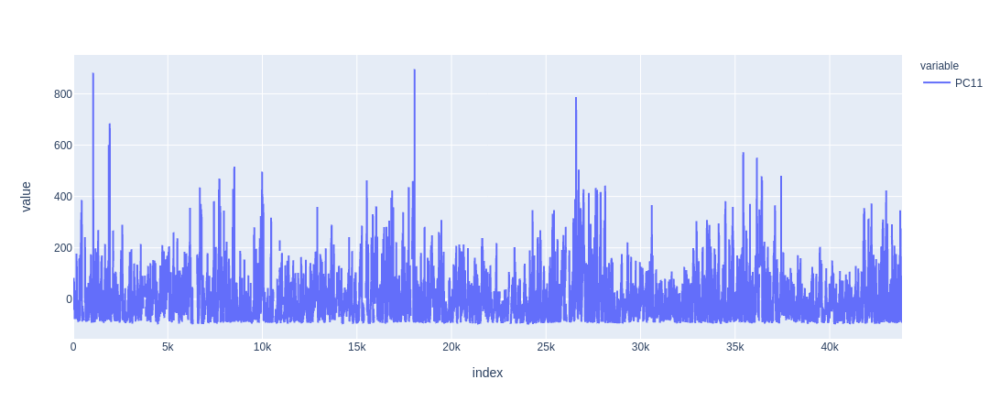

In [12]:
fig = px.line(PC1)
fig.show()

In [17]:
PC1.dot(eigen[1][:1]).rename(columns={0:'pm2.5', 1:'DEWP', 2:'TEMP', 3:'PRES', 4:'Iws_x', 5:'Ir_x', 6:'Is_x'}).tail()

,pm2.5,DEWP,TEMP,PRES,Iws_x,Ir_x,Is_x
43819,-89.541393,1.310378,1.832688,-1.696898,0.304689,0.075658,-0.001534
43820,-87.537573,1.281054,1.791675,-1.658923,0.297871,0.073965,-0.001499
43821,-87.534547,1.281010,1.791613,-1.658866,0.297861,0.073962,-0.001499
43822,-89.509034,1.309905,1.832026,-1.696284,0.304579,0.075631,-0.001533
43823,-85.545089,1.251895,1.750894,-1.621164,0.291091,0.072281,-0.001465


# Todo
1. Make PCA Decompressor
2. Make PCA Metadata

In [13]:
RC = PC1.dot(eigen[1][:1]).rename(columns={0:'pm2.5', 1:'DEWP', 2:'TEMP', 3:'PRES', 4:'Iws_x', 5:'Ir_x', 6:'Is_x'})
np.mean(np.power(RC['pm2.5'] - bpi_normal['pm2.5'], 2)) * 100 / np.mean(np.power(bpi_normal['pm2.5'], 2))

0.004558461326058276

# Mathematical Models

## Seasonal ARIMA Mathematical Model
<font style='font-size : 1.15em;'>
\begin{equation*}
Cov(S_{t}, S_{t-k}) = \mathop{\mathbb{E}}(S_{t}S_{t-k}) - \mathop{\mathbb{E}}(S_{t})\mathop{\mathbb{E}}(S_{t-k}) \\
\beta^\tau = S_{\tau} - \mu = \epsilon_{\tau} \\
\tau = t - (t - k) \\
\phi_{n} = \mathop{min}_{\beta^\tau} AR_{n}(S_{\tau}) \\
\end{equation*}
\begin{equation*}
ARIMA(p, d, q)\times(P, D, Q)m \\ 
S_{t} = (1-\beta^d)(1-\beta^{m \times D})(1-\phi_{d}\beta^d)(1-\phi_{m \times D}\beta^{m \times D})
\end{equation*}
</font>

## Autocorrelation of Sample Space
The Autocorrelation of a Sample space is defined by Expectation of Signal with respect to lag.
<font style='font-size : 1.15em;'>
\begin{equation*}
    R_{XX}(\tau) = [\mathop{\mathbb{E}}(X_{t}, \bar{X}_{t-\tau})]
\end{equation*}
</font>

## Partial Correlation of Sample Space
The Partial Correlation of a Sample space is defined by the Surjective Orthogonal Projections of the Signal or Hilbert Transforms.
<font style='font-size : 1.15em;'>
\begin{equation*}
    \alpha(\tau) = {{Cov(S_{t}, S_{t-\tau})} \over {\sigma_{t}\sigma_{t-\tau}}} \\ \\
    \alpha(k) = {{Cov(S_{t} - P_{t}(S_{t}), S_{t-\tau} - P_{t,\tau}(S_{t-\tau}))} \over {\sigma_{t}\sigma_{t-\tau}}} \\ \\
    P_{t, \tau}(f_{t}) = \mathop{H}(f_{t})(t)
\end{equation*}
</font>

## Fourier Correlation of Sample Space
The Fourier Correlation of a Sample space is defined by the Power Sprectral Density of a Time Series by the Wiener-Kitchner Theorem
<font style='font-size : 1.15em;'>
\begin{equation*}
    R_{XX}(\tau) = \int_{-\infty}^{\infty}S_{XX}(f_{t})e^{i2 \pi f_{t}\tau}df \\
    S_{XX}(f_{t}) = \int_{-\infty}^{\infty}R_{XX}(\tau)e^{i2 \pi f_{t}\tau}d\tau
\end{equation*}
</font>

In [14]:
def auto_train(X, Xval):
    AR_Val = [0, 1, 2, 4, 6, 8, 10]
    MA_Val = [0, 1, 2]
    D_Val = [0, 1, 2]
    model_select = {}
    steps = len(Xval)
    mse_log = []
    for i in AR_Val:
        for j in MA_Val:
            for k in D_Val:
                order = (i, j, k)
                try:
                    model = sm.tsa.arima.ARIMA(X, order=order)
                    fitting = model.fit().forecast(steps)
                    error = np.mean(np.power(fitting-Xval, 2))
                    model_select[error] = model
                    mse_log.append(error)
                except:
                    continue
#     print(mse_log)
    return model_select[np.min(mse_log)], np.min(mse_log)/np.mean(np.power(Xval, 2)) if len(mse_log) != 0 else model_select

In [95]:
# best_model, mse = auto_train(PC1['PC11'][24:1024], PC1['PC11'][1024:1044])
best_model = sm.tsa.arima.ARIMA(np.log(bpi['pm2.5'][50:1050]), order=(3,1,3), seasonal_order=(0,1,2,24))
predictor = best_model.fit()
best_model.fit().summary()
# best_model

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                       
=============================================================================================
Dep. Variable:                                 pm2.5   No. Observations:                 1000
Model:             ARIMA(3, 1, 3)x(0, 1, [1, 2], 24)   Log Likelihood                -103.776
Date:                               Wed, 28 Oct 2020   AIC                            225.551
Time:                                       00:19:37   BIC                            269.493
Sample:                                            0   HQIC                           242.273
                                              - 1000                                         
Covariance Type:                                 opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4247      0.126     -3.374      0.001      -0.671      -0.178
ar.L2          0.4708      0.114      4.125      0.000       0.247       0.694
ar.L3          0.5922      0.138      4.301      0.000       0.322       0.862
ma.L1          0.4468      0.113      3.971      0.000       0.226       0.667
ma.L2         -0.4941      0.098     -5.067      0.000      -0.685      -0.303
ma.L3         -0.7134      0.118     -6.025      0.000      -0.945      -0.481
ma.S.L24      -0.9733      0.036    -27.175      0.000      -1.044      -0.903
ma.S.L48       0.0262      0.035      0.747      0.455      -0.042       0.095
sigma2         0.0689      0.002     33.530      0.000       0.065       0.073
===================================================================================
Ljung-Box (Q):                       42.14   Jarque-Bera (JB):               838.64
Prob(Q):                              0.38   Prob(JB):                         0.00
Heteroskedasticity (H):               1.37   Skew:                            -0.48
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [99]:
res = predictor.get_prediction(start=1000, end=1999)
res.summary_frame()

pm2.5,mean,mean_se,mean_ci_lower,mean_ci_upper
1050,4.319381,0.262722,3.804455,4.834307
1051,4.407892,0.375656,3.671620,5.144164
1052,4.467621,0.456795,3.572319,5.362922
1053,4.486887,0.513429,3.480585,5.493189
1054,4.402220,0.568716,3.287558,5.516883
...,...,...,...,...
2045,3.860822,11.845138,-19.355221,27.076866
2046,3.813244,11.857825,-19.427666,27.054154
2047,3.835404,11.870484,-19.430318,27.101126
2048,3.837946,11.883131,-19.452564,27.128455


In [102]:
np.mean(np.power(res.summary_frame()['mean']-np.log(bpi['pm2.5'][1050:2050]), 2)) * 100 / np.nanmean(np.power(np.log(bpi['pm2.5'][1050:2050]),2))

4.546363707395106

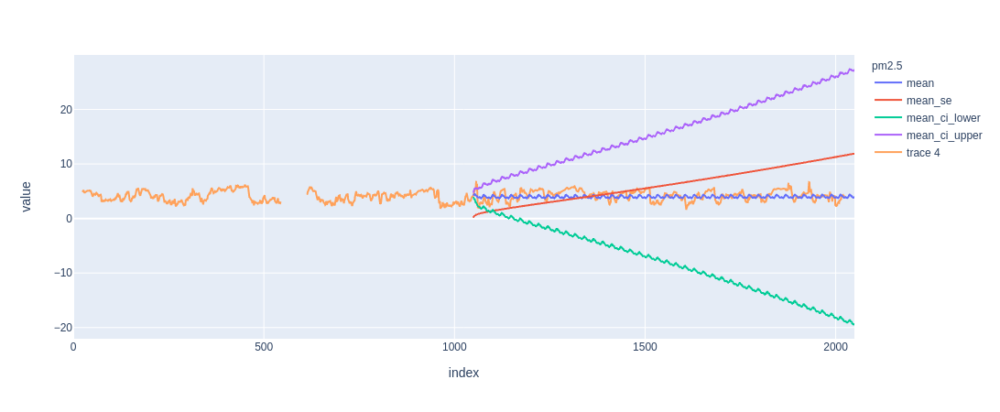

In [103]:
fig = px.line(res.summary_frame())
fig.add_scatter(y=np.log(bpi['pm2.5'][:2024]))
fig.show()

In [104]:
from fbprophet import Prophet

In [105]:
df_train = DataFrame()
df_train['y'] = np.log(bpi['pm2.5'])
df_train['ds'] = bpi['ds'].reset_index()['ds']
# df_train.reset_index(inplace=True)
df_train

/usr/lib/python3/dist-packages/pandas/core/series.py:679: RuntimeWarning:

divide by zero encountered in log



,y,ds
0,NaN,2010-01-01 00:00:00
1,NaN,2010-01-01 01:00:00
2,NaN,2010-01-01 02:00:00
3,NaN,2010-01-01 03:00:00
4,NaN,2010-01-01 04:00:00
...,...,...
43819,2.079442,2014-12-31 19:00:00
43820,2.302585,2014-12-31 20:00:00
43821,2.302585,2014-12-31 21:00:00
43822,2.079442,2014-12-31 22:00:00


In [106]:
forecaster = Prophet(daily_seasonality=False, weekly_seasonality=True)
forecaster.fit(df_train[:1000])

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


In [107]:
future = forecaster.make_future_dataframe(100)
future
forecast = forecaster.predict(future)

In [108]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-01-01 00:00:00,3.969404,2.504617,4.744876,3.969404,3.969404,-0.360786,-0.360786,-0.360786,-0.360786,-0.360786,-0.360786,0.0,0.0,0.0,3.608618
1,2010-01-01 01:00:00,3.969835,2.516906,4.742028,3.969835,3.969835,-0.336936,-0.336936,-0.336936,-0.336936,-0.336936,-0.336936,0.0,0.0,0.0,3.632899
2,2010-01-01 02:00:00,3.970267,2.556722,4.773639,3.970267,3.970267,-0.312978,-0.312978,-0.312978,-0.312978,-0.312978,-0.312978,0.0,0.0,0.0,3.657289
3,2010-01-01 03:00:00,3.970698,2.475804,4.808236,3.970698,3.970698,-0.289024,-0.289024,-0.289024,-0.289024,-0.289024,-0.289024,0.0,0.0,0.0,3.681674
4,2010-01-01 04:00:00,3.971129,2.516510,4.829378,3.971129,3.971129,-0.265180,-0.265180,-0.265180,-0.265180,-0.265180,-0.265180,0.0,0.0,0.0,3.705949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,2010-05-18 15:00:00,3.564598,0.885608,6.488924,1.135587,6.005901,0.237656,0.237656,0.237656,0.237656,0.237656,0.237656,0.0,0.0,0.0,3.802254
1096,2010-05-19 15:00:00,3.560603,0.491180,5.764831,1.077226,6.038813,-0.386135,-0.386135,-0.386135,-0.386135,-0.386135,-0.386135,0.0,0.0,0.0,3.174468
1097,2010-05-20 15:00:00,3.556607,0.218940,5.838221,1.020342,6.067620,-0.549622,-0.549622,-0.549622,-0.549622,-0.549622,-0.549622,0.0,0.0,0.0,3.006986
1098,2010-05-21 15:00:00,3.552612,0.643787,6.193827,0.970795,6.091992,-0.031840,-0.031840,-0.031840,-0.031840,-0.031840,-0.031840,0.0,0.0,0.0,3.520772


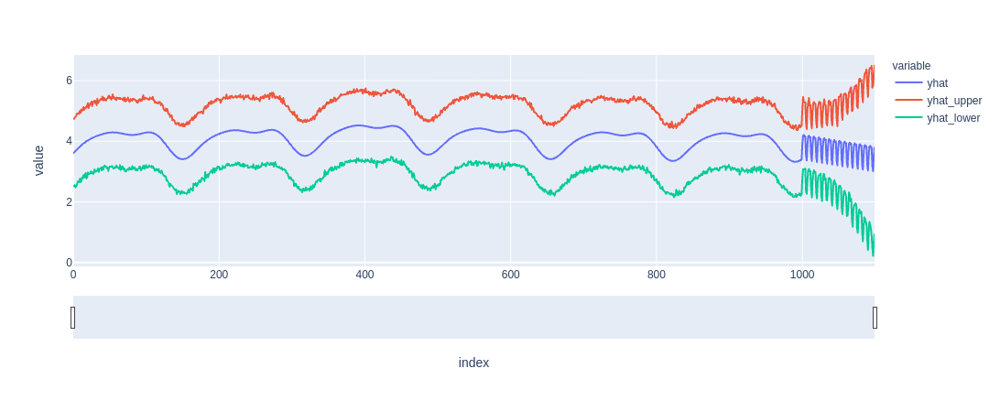

In [109]:
fig = px.line(forecast[['yhat','yhat_upper','yhat_lower']])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

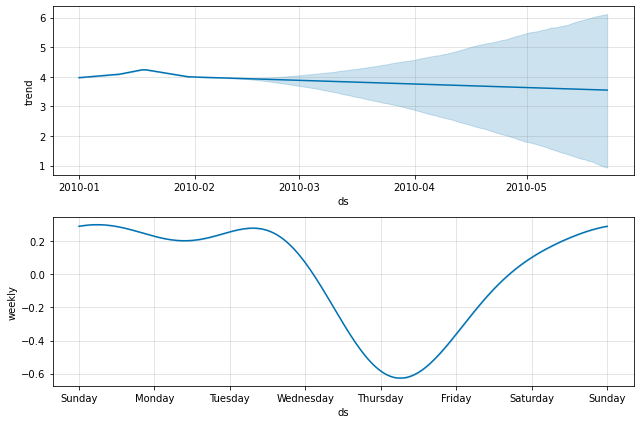

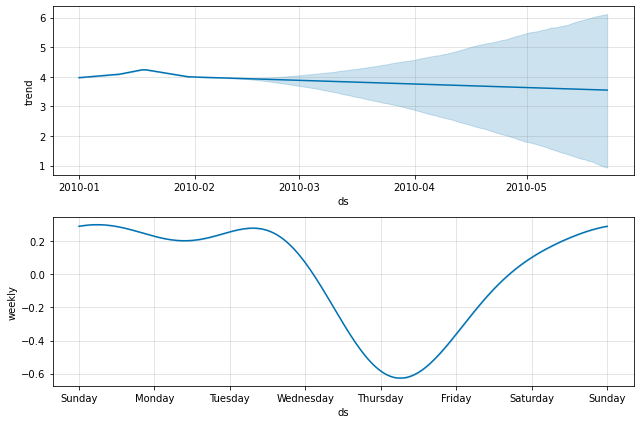

In [110]:
forecaster.plot_components(forecast)

In [330]:
import pmdarima
model = pmdarima.auto_arima(np.log(bpi.dropna()['pm2.5'][:1000]))
model.summary()

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/statespace/sarimax.

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1000
Model:               SARIMAX(3, 1, 3)   Log Likelihood                -162.565
Date:                Sun, 25 Oct 2020   AIC                            341.131
Time:                        20:05:01   BIC                            380.385
Sample:                             0   HQIC                           356.051
                               - 1000                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0001      0.001      0.197      0.844      -0.001       0.002
ar.L1         -0.0863      0.103     -0.834      0.404      -0.289       0.117
ar.L2          0.4319      0.107      4.050      0.000       0.223       0.641
ar.L3          0.4634      0.097      4.772      0.000       0.273       0.654
ma.L1          0.1865      0.098      1.900      0.057      -0.006       0.379
ma.L2         -0.4795      0.093     -5.147      0.000      -0.662      -0.297
ma.L3         -0.6401      0.089     -7.178      0.000      -0.815      -0.465
sigma2         0.0799      0.002     38.106      0.000       0.076       0.084
===================================================================================
Ljung-Box (L1) (Q):                   0.59   Jarque-Bera (JB):              3538.23
Prob(Q):                              0.44   Prob(JB):                         0.00
Heteroskedasticity (H):               1.76   Skew:                            -0.93
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""